### Installing Detectron2

In [ ]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-pvd4ptck
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-pvd4ptck
  Resolved https://github.com/facebookresearch/detectron2.git to commit 9604f5995cc628619f0e4fd913453b4d7d61db3f
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.2/79.2 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 12.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 15.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 53.9 MB/s eta 0:00:00
  Created wheel for detectron2: filename=detectron2-0.6-cp3

### Importing Libraries

In [ ]:
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.config import get_cfg
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2 import model_zoo
from detectron2.data.datasets import register_coco_instances
from detectron2.modeling import build_model
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.utils.logger import setup_logger
setup_logger()

import random
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Registering the dataset

In [ ]:
register_coco_instances("my_dataset_train", {}, "/content/drive/MyDrive/Lung_Cancer/LIDC-IDRI Dataset CT Images/CT/train/coco_dataset_train_spiculation.json", "/content/drive/MyDrive/Lung_Cancer/LIDC-IDRI Dataset CT Images/CT/train/")
register_coco_instances("my_dataset_val", {}, "/content/drive/MyDrive/Lung_Cancer/LIDC-IDRI Dataset CT Images/CT/val/coco_dataset_val_spiculation.json", "/content/drive/MyDrive/Lung_Cancer/LIDC-IDRI Dataset CT Images/CT/val")
register_coco_instances("my_dataset_test", {}, "/content/drive/MyDrive/Lung_Cancer/LIDC-IDRI Dataset CT Images/CT/test/coco_dataset_test_spiculation.json", "/content/drive/MyDrive/Lung_Cancer/LIDC-IDRI Dataset CT Images/CT/test")

### Visualisation of Data

[01/29 01:12:20 d2.data.datasets.coco]: Loading /content/drive/MyDrive/Lung_Cancer/LIDC-IDRI Dataset CT Images/CT/train/coco_dataset_train_spiculation.json takes 40.37 seconds.
[01/29 01:12:20 d2.data.datasets.coco]: Loaded 11673 images in COCO format from /content/drive/MyDrive/Lung_Cancer/LIDC-IDRI Dataset CT Images/CT/train/coco_dataset_train_spiculation.json


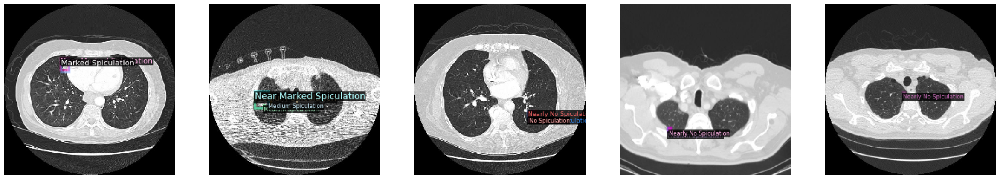

In [ ]:

my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

fig, axs = plt.subplots(1, 5, figsize=(30, 10))
base_dir = "/content/drive/MyDrive/Lung_Cancer/LIDC-IDRI Dataset CT Images/CT/"
for ax, d in zip(axs, random.sample(dataset_dicts, 5)):
    img_path = os.path.join(base_dir, d["file_name"])
    img = cv2.imread(img_path)
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    img_rgb = vis.get_image()[:, :, ::-1]

    ax.imshow(img_rgb)
    ax.axis('off')

plt.show()

### Model Loading, setting up configurations and Training

In [ ]:
# Read https://github.com/facebookresearch/detectron2/blob/main/detectron2/config/defaults.py before setting configs
cfg = get_cfg()


cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")

cfg.DATALOADER.NUM_WORKERS = 32

cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.INPUT.MIN_SIZE_TRAIN = (512,)
cfg.INPUT.MAX_SIZE_TRAIN = 512
cfg.INPUT.MIN_SIZE_TEST = 512
cfg.INPUT.MAX_SIZE_TEST = 512
cfg.INPUT.RANDOM_FLIP="none"

cfg.MODEL.DEVICE = "cuda"
cfg.MODEL.BACKBONE.FREEZE_AT=2
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 5

cfg.SOLVER.MAX_ITER = 1000
cfg.SOLVER.AMP.ENABLED = True
cfg.SOLVER.BASE_LR = 0.0001
cfg.SOLVER.IMS_PER_BATCH =32

# cfg.CUDNN_BENCHMARK = True

# cfg.TEST.EVAL_PERIOD = 50

cfg.OUTPUT_DIR = "./SpiculationOutput"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [ ]:
from detectron2.config import CfgNode
from detectron2.solver.build import get_default_optimizer_params, maybe_add_gradient_clipping
import torch

class MyTrainer(DefaultTrainer):
    @classmethod
    def build_optimizer(cls, cfg: CfgNode, model: torch.nn.Module) -> torch.optim.Optimizer:
        """
        Build an optimizer from config.
        """
        params = get_default_optimizer_params(
            model,
            base_lr=cfg.SOLVER.BASE_LR,
            weight_decay_norm=cfg.SOLVER.WEIGHT_DECAY_NORM,
            bias_lr_factor=cfg.SOLVER.BIAS_LR_FACTOR,
            weight_decay_bias=cfg.SOLVER.WEIGHT_DECAY_BIAS,
        )
        return maybe_add_gradient_clipping(cfg, torch.optim.AdamW)(
            params,
            lr=cfg.SOLVER.BASE_LR,
            weight_decay=cfg.SOLVER.WEIGHT_DECAY,
        )

In [ ]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning, module="detectron2.engine.train_loop")

In [ ]:
# trainer = DefaultTrainer(cfg)
trainer = MyTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.model.to("cuda")
trainer.train()

[01/29 01:12:25 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
model_final_f6e8b1.pkl: 243MB [00:01, 183MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[01/29 01:12:27 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.11/dist-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:224: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(


[01/29 01:13:24 d2.utils.events]:  eta: 0:30:34  iter: 19  total_loss: 3.502  loss_cls: 1.727  loss_box_reg: 0.01718  loss_rpn_cls: 1.374  loss_rpn_loc: 0.3539    time: 2.5295  last_time: 1.9627  data_time: 0.8977  last_data_time: 0.1158   lr: 1.9981e-06  max_mem: 6994M
[01/29 01:14:03 d2.utils.events]:  eta: 0:27:16  iter: 39  total_loss: 2.067  loss_cls: 1.481  loss_box_reg: 0.03192  loss_rpn_cls: 0.2745  loss_rpn_loc: 0.26    time: 2.0818  last_time: 1.6491  data_time: 0.0934  last_data_time: 0.0603   lr: 3.9961e-06  max_mem: 6994M
[01/29 01:14:37 d2.utils.events]:  eta: 0:27:32  iter: 59  total_loss: 0.7312  loss_cls: 0.2565  loss_box_reg: 0.02463  loss_rpn_cls: 0.2245  loss_rpn_loc: 0.2053    time: 1.9585  last_time: 1.5529  data_time: 0.0917  last_data_time: 0.0698   lr: 5.9941e-06  max_mem: 6994M
[01/29 01:15:11 d2.utils.events]:  eta: 0:26:08  iter: 79  total_loss: 0.4784  loss_cls: 0.1254  loss_box_reg: 0.02691  loss_rpn_cls: 0.1551  loss_rpn_loc: 0.1559    time: 1.8844  last_

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [ ]:
%load_ext tensorboard
%tensorboard --logdir ./SpiculationOutput

<IPython.core.display.Javascript object>

### Inference and Evaluaton

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.DATASETS.TEST = ("my_dataset_test", )
predictor = DefaultPredictor(cfg)

[01/29 01:42:45 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./SpiculationOutput/model_final.pth ...


/usr/local/lib/python3.11/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

[01/29 01:42:51 d2.data.datasets.coco]: Loading /content/drive/MyDrive/Lung_Cancer/LIDC-IDRI Dataset CT Images/CT/test/coco_dataset_test_spiculation.json takes 5.86 seconds.
[01/29 01:42:51 d2.data.datasets.coco]: Loaded 1451 images in COCO format from /content/drive/MyDrive/Lung_Cancer/LIDC-IDRI Dataset CT Images/CT/test/coco_dataset_test_spiculation.json


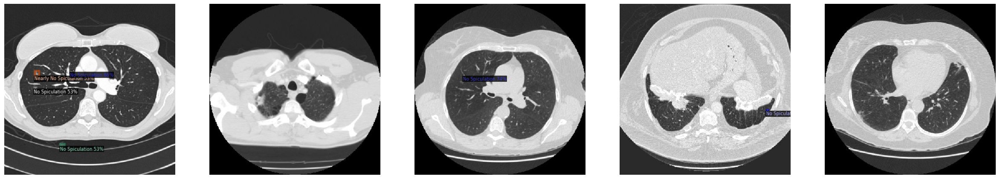

In [ ]:
dataset_dicts = DatasetCatalog.get("my_dataset_test")

fig, axs = plt.subplots(1, 5, figsize=(30, 10))

for ax, d in zip(axs, random.sample(dataset_dicts, 5)):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=my_dataset_train_metadata,
                   scale=0.6
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    img_rgb = v.get_image()[:, :, ::-1]

    ax.imshow(img_rgb)
    ax.axis('off')

plt.show()

Evaluating on Validation Dataset

In [ ]:
val_evaluator = COCOEvaluator("my_dataset_val", output_dir= "./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_val")
print(inference_on_dataset(trainer.model, val_loader, val_evaluator))

[01/29 01:42:56 d2.data.datasets.coco]: Loaded 1511 images in COCO format from /content/drive/MyDrive/Lung_Cancer/LIDC-IDRI Dataset CT Images/CT/val/coco_dataset_val_spiculation.json
[01/29 01:42:56 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[01/29 01:42:56 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[01/29 01:42:56 d2.data.common]: Serializing 1511 elements to byte tensors and concatenating them all ...
[01/29 01:42:56 d2.data.common]: Serialized dataset takes 0.57 MiB
[01/29 01:42:56 d2.evaluation.evaluator]: Start inference on 1511 batches


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


[01/29 01:42:58 d2.evaluation.evaluator]: Inference done 11/1511. Dataloading: 0.0272 s/iter. Inference: 0.1081 s/iter. Eval: 0.0004 s/iter. Total: 0.1357 s/iter. ETA=0:03:23
[01/29 01:43:03 d2.evaluation.evaluator]: Inference done 42/1511. Dataloading: 0.0518 s/iter. Inference: 0.1098 s/iter. Eval: 0.0004 s/iter. Total: 0.1623 s/iter. ETA=0:03:58
[01/29 01:43:08 d2.evaluation.evaluator]: Inference done 73/1511. Dataloading: 0.0524 s/iter. Inference: 0.1104 s/iter. Eval: 0.0004 s/iter. Total: 0.1634 s/iter. ETA=0:03:54
[01/29 01:43:13 d2.evaluation.evaluator]: Inference done 108/1511. Dataloading: 0.0464 s/iter. Inference: 0.1104 s/iter. Eval: 0.0003 s/iter. Total: 0.1572 s/iter. ETA=0:03:40
[01/29 01:43:18 d2.evaluation.evaluator]: Inference done 145/1511. Dataloading: 0.0391 s/iter. Inference: 0.1124 s/iter. Eval: 0.0004 s/iter. Total: 0.1519 s/iter. ETA=0:03:27
[01/29 01:43:23 d2.evaluation.evaluator]: Inference done 178/1511. Dataloading: 0.0390 s/iter. Inference: 0.1129 s/iter. Ev

Evaluating on Test Dataset

In [ ]:
test_evaluator = COCOEvaluator("my_dataset_test", output_dir= "./output")
test_loader = build_detection_test_loader(cfg, "my_dataset_test")
print(inference_on_dataset(predictor.model, test_loader, test_evaluator))

[01/29 01:47:19 d2.data.datasets.coco]: Loaded 1451 images in COCO format from /content/drive/MyDrive/Lung_Cancer/LIDC-IDRI Dataset CT Images/CT/test/coco_dataset_test_spiculation.json
[01/29 01:47:19 d2.data.build]: Distribution of instances among all 5 categories:
|   category    | #instances   |   category    | #instances   |   category    | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:-------------:|:-------------|
| No Spiculat.. | 2386         | Nearly No S.. | 789          | Medium Spic.. | 429          |
| Near Marked.. | 293          | Marked Spic.. | 244          |               |              |
|     total     | 4141         |               |              |               |              |
[01/29 01:47:19 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[01/29 01:47:19 d2.data.common]: Serializing the dataset using: <class 'detectr

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


[01/29 01:47:22 d2.evaluation.evaluator]: Inference done 11/1451. Dataloading: 0.0688 s/iter. Inference: 0.1066 s/iter. Eval: 0.0003 s/iter. Total: 0.1756 s/iter. ETA=0:04:12
[01/29 01:47:27 d2.evaluation.evaluator]: Inference done 47/1451. Dataloading: 0.0403 s/iter. Inference: 0.1076 s/iter. Eval: 0.0002 s/iter. Total: 0.1482 s/iter. ETA=0:03:28
[01/29 01:47:32 d2.evaluation.evaluator]: Inference done 80/1451. Dataloading: 0.0405 s/iter. Inference: 0.1093 s/iter. Eval: 0.0002 s/iter. Total: 0.1500 s/iter. ETA=0:03:25
[01/29 01:47:37 d2.evaluation.evaluator]: Inference done 114/1451. Dataloading: 0.0402 s/iter. Inference: 0.1096 s/iter. Eval: 0.0002 s/iter. Total: 0.1501 s/iter. ETA=0:03:20
[01/29 01:47:42 d2.evaluation.evaluator]: Inference done 149/1451. Dataloading: 0.0389 s/iter. Inference: 0.1091 s/iter. Eval: 0.0002 s/iter. Total: 0.1484 s/iter. ETA=0:03:13
[01/29 01:47:47 d2.evaluation.evaluator]: Inference done 185/1451. Dataloading: 0.0372 s/iter. Inference: 0.1091 s/iter. Ev

In [ ]:
os.environ["LC_ALL"] = "C.UTF-8"
os.environ["LANG"] = "C.UTF-8"

import shutil
import os

source_folder = "./SpiculationOutput"
destination_folder = "/content/drive/MyDrive/SpiculationOutput"

os.makedirs(destination_folder, exist_ok=True)

shutil.copytree(source_folder, destination_folder, dirs_exist_ok=True)

print(f"Folder successfully copied to {destination_folder}")


Folder successfully copied to /content/drive/MyDrive/SpiculationOutput
